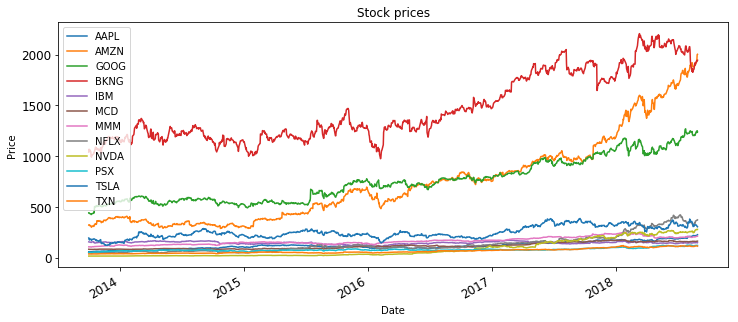

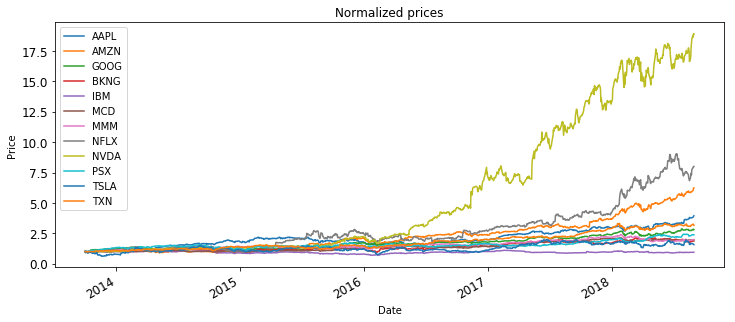

In [1]:
"""Normalizing"""

import os
import pandas as pd
import matplotlib.pyplot as plt

def plot_selected(df, columns, start_index, end_index):
    """Plot the desired columns over index values in the given range."""
    # TODO: Your code here
    # Note: DO NOT modify anything else!
    plot_data(df.ix[start_index:end_index,columns], title="Selected data")

def symbol_to_path(symbol, base_dir="data/SP500/symbols"):
    """Return CSV file path given ticker symbol."""
    return os.path.join(base_dir, "{}.csv".format(str(symbol)))


def get_data(symbols, dates):
    """Read stock data (adjusted close) for given symbols from CSV files."""
    df = pd.DataFrame(index=dates)
    if 'AAPL' not in symbols:  # add SPY for reference, if absent
        symbols.insert(0, 'AAPL')

    for symbol in symbols:
        df_temp = pd.read_csv(symbol_to_path(symbol), index_col='Date',
                parse_dates=True, usecols=['Date', 'Adj Close'], na_values=['nan'])
        df_temp = df_temp.rename(columns={'Adj Close': symbol})
        df = df.join(df_temp)
        if symbol == 'AAPL':  # drop dates SPY did not trade
            df = df.dropna(subset=["AAPL"])

    return df


def normalize_data(df):
    '''Normalize stock price using the first row of the dataframe'''
    #normalizing_data = df.copy() # copy gibe DtaFrame to match size and column names
    # compute daily return for row 1 onwards
    normalizing_data = df/ df.iloc[0,:] # cumulative return is the same as normalitation
    #normalizing_data.iloc[0, :] = 0 # set daily returns  for  row 0 to 0
    return normalizing_data
     
    #return df/ df.ix[0,:]

def plot_data(df, title="Stock prices"):
    """Plot stock prices with a custom title and meaningful axis labels."""
    ax = df.plot(title=title, fontsize=12, figsize=(12,5))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.show() # must be called to show pots in some enviroments

    
def test_run():
    # Define a date range
    dates = pd.date_range('2013-10-01', '2018-09-27')

    # Choose stock symbols to read
    #symbols = ['AAPL', 'IBM', 'AMZN']  # SPY will be added in get_data()
    symbols = ['AAPL', 'AMZN', 'GOOG', 'BKNG', 'IBM', 'MCD', 'MMM', 'NFLX', 'NVDA', 'PSX', 'TSLA', 'TXN']
    # Get stock data
    df = get_data(symbols, dates)

    # Slice and plot
    plot_data(df)

    # Compute daily returns
    normalizing_data = normalize_data(df)
    plot_data(normalizing_data, title="Normalized prices")
    
if __name__ == "__main__":
    test_run()

## historical representation of price behavior by symbolo

In [13]:
# Getting data from Yahoo Finance
from pandas_datareader import data as pdr

import fix_yahoo_finance as yf
yf.pdr_override() # <== that's all it takes :-)

data = pdr.get_data_yahoo(['MMM', 'TXN', 'PSX', 'TSLA', 'IBM', 'AAPL', 'NVDA', 'BKNG', 'MCD', 'NFLX', 'AMZN', 'GOOG'], start="2013-10-01", end="2018-09-28")


[*********************100%***********************]  12 of 12 downloaded


In [14]:
data2 = data.drop(['Open', 'High', 'Low', 'Close', 'Volume'], axis = 1)

/home/felipemartinezs/anaconda3/envs/stock-price-indicator/lib/python3.6/site-packages/pandas/core/generic.py:3111: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# Optional Plotly Method Imports
import plotly
import cufflinks as cf
cf.go_offline()

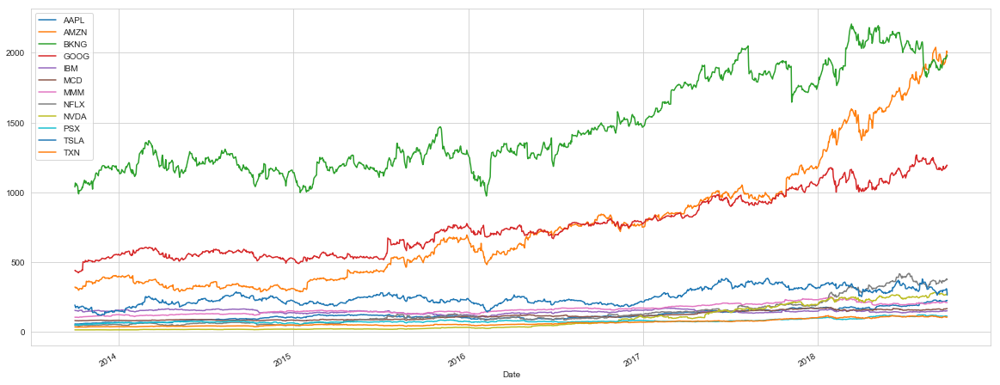

In [16]:
data2.xs(key='Adj Close', axis=1).plot(figsize=(20,8))

In [17]:
data2.xs(key='Adj Close', axis=1).iplot()

## Statistics

In [19]:
tickers = ['MMM', 'TXN', 'PSX', 'TSLA', 'IBM', 'AAPL', 'NVDA', 'HD', 'MCD', 'NFLX', 'AMZN', 'GOOG']

In [20]:

for ticker in tickers:
    """Return the mean for stock indicated by symbol.
    
    Note: Data for a stock is stored in file: data//SP500/symbols/<symbol>.csv
    """
    df = pd.read_csv("data/SP500/symbols/{}.csv".format(ticker))  # read in data
    sta = df.describe()#(include='all')
    print()
    print("Describe Symbol: {}".format(ticker))
    print()
    
    print("%14s               %15s" % ('statistic', 'Indicators'))
    print(60 * "-")
    #print('-------------------------')
    print (sta)


Describe Symbol: MMM

     statistic                    Indicators
------------------------------------------------------------
              Open         High          Low        Close    Adj Close  \
count  1239.000000  1239.000000  1239.000000  1239.000000  1239.000000   
mean    172.480484   173.572486   171.406739   172.560315   162.968622   
std      31.337572    31.546574    31.041496    31.283243    34.954850   
min     117.269997   117.959999   116.650002   117.160004   103.509911   
25%     145.409996   146.514999   144.779999   145.540001   133.564445   
50%     166.300003   167.360001   165.279999   166.490005   154.599670   
75%     197.379997   198.735001   196.305001   197.560005   193.949737   
max     258.510010   259.769989   255.970001   258.630005   253.667068   

             Volume  
count  1.239000e+03  
mean   2.299762e+06  
std    1.026611e+06  
min    6.510000e+05  
25%    1.685700e+06  
50%    2.064400e+06  
75%    2.614850e+06  
max    1.167140e+07  

Descr


Describe Symbol: AMZN

     statistic                    Indicators
------------------------------------------------------------
              Open         High          Low        Close    Adj Close  \
count  1239.000000  1239.000000  1239.000000  1239.000000  1239.000000   
mean    738.193576   744.715916   730.614876   738.137288   738.137288   
std     420.424817   423.742378   416.368915   420.467939   420.467939   
min     284.399994   290.420013   284.000000   286.950012   286.950012   
25%     374.019989   378.150010   371.529999   374.259994   374.259994   
50%     658.650024   664.880005   652.000000   659.369995   659.369995   
75%     959.690002   966.519989   953.084992   959.515015   959.515015   
max    1997.420044  2025.569946  1986.900024  2002.380005  2002.380005   

             Volume  
count  1.239000e+03  
mean   3.982828e+06  
std    2.250929e+06  
min    1.093000e+06  
25%    2.647050e+06  
50%    3.420400e+06  
75%    4.507150e+06  
max    2.385610e+07  

Desc

## Bollinger bands

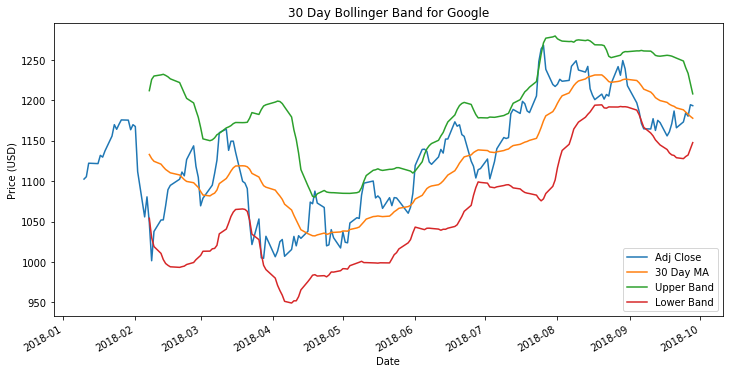

In [3]:
# Setting up a Bollinger Band with Python
# https://medium.com/python-data/setting-up-a-bollinger-band-with-python-28941e2fa300

# import needed libraries
import pandas as pd
import matplotlib.pyplot as plt
from pandas_datareader import data as web

# Make function for calls to Yahoo Finance
def get_adj_close(ticker, start, end):
    '''
    A function that takes ticker symbols, starting period, ending period
    as arguments and returns with a Pandas DataFrame of the Adjusted Close Prices
    for the tickers from Yahoo Finance
    '''
    start = start
    end = end
    info = web.DataReader(ticker, data_source='yahoo', start=start, end=end)['Adj Close']
    return pd.DataFrame(info)

# Get Adjusted Closing Prices for Facebook, Tesla and Amazon between 2016-2017
goog = get_adj_close('goog', '1/10/2018', '28/09/2018')
bkng = get_adj_close('bkng', '1/1/2018', '28/09/2018')
amazon = get_adj_close('amzn', '1/1/2018', '28/09/2018')

# Calculate 30 Day Moving Average, Std Deviation, Upper Band and Lower Band

for item in (goog, bkng, amazon):
    item['30 Day MA'] = item['Adj Close'].rolling(window=20).mean()
    item['30 Day STD'] = item['Adj Close'].rolling(window=20).std()
    item['Upper Band'] = item['30 Day MA'] + (item['30 Day STD'] * 2)
    item['Lower Band'] = item['30 Day MA'] - (item['30 Day STD'] * 2)


# Simple 30 Day Bollinger Band for Facebook (2016-2017)
goog[['Adj Close', '30 Day MA', 'Upper Band', 'Lower Band']].plot(figsize=(12,6))
plt.title('30 Day Bollinger Band for Google')
plt.ylabel('Price (USD)')
plt.show();

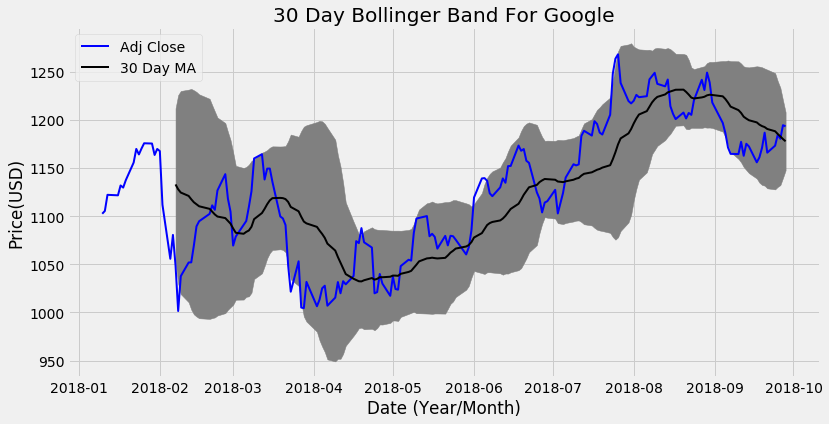

In [4]:
# set style, empty figure and axes
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)

# Get index values for the X axis for facebook DataFrame
x_axis = goog.index.get_level_values(0)

# Plot shaded 21 Day Bollinger Band for Facebook
ax.fill_between(x_axis, goog['Upper Band'], goog['Lower Band'], color='grey')

# Plot Adjust Closing Price and Moving Averages
ax.plot(x_axis, goog['Adj Close'], color='blue', lw=2)
ax.plot(x_axis, goog['30 Day MA'], color='black', lw=2)

# Set Title & Show the Image
ax.set_title('30 Day Bollinger Band For Google')
ax.set_xlabel('Date (Year/Month)')
ax.set_ylabel('Price(USD)')
ax.legend()
plt.show();

## Return

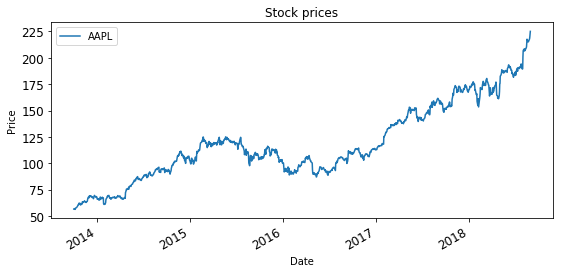

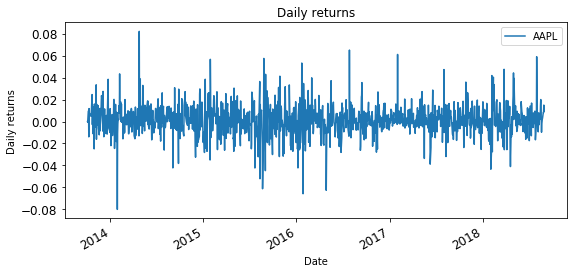

In [1]:
"""Compute daily returns."""

import os
import pandas as pd
import matplotlib.pyplot as plt

def symbol_to_path(symbol, base_dir="data/SP500/symbols"):
    """Return CSV file path given ticker symbol."""
    return os.path.join(base_dir, "{}.csv".format(str(symbol)))

def get_data(symbols, dates):
    """Read stock data (adjusted close) for given symbols from CSV files."""
    df = pd.DataFrame(index=dates)
    if 'AAPL' not in symbols:  # add SPY for reference, if absent
        symbols.insert(0, 'AAPL')

    for symbol in symbols:
        df_temp = pd.read_csv(symbol_to_path(symbol), index_col='Date',
                parse_dates=True, usecols=['Date', 'Adj Close'], na_values=['nan'])
        df_temp = df_temp.rename(columns={'Adj Close': symbol})
        df = df.join(df_temp)
        if symbol == 'AAPL':  # drop dates SPY did not trade
            df = df.dropna(subset=["AAPL"])

    return df

def plot_data(df, title="Stock prices", xlabel="Date", ylabel="Price"):
    """Plot stock prices with a custom title and meaningful axis labels."""
    ax = df.plot(title=title, fontsize=12, figsize=(9,4))
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.show()


def compute_daily_returns(df):
    """Compute and return the daily return values."""
    # TODO: Your code here
    # Note: Returned DataFrame must have the same number of rows
    daily_returns = df.copy() # copy gibe DtaFrame to match size and column names
    # compute daily return for row 1 onwards
    daily_returns[1:] = (df[1:] / df[:-1].values) - 1
    #daily_returns.ix[0, :] = 0 # set daily returns  for  row 0 to 0
    daily_returns.iloc[0, :] = 0 # set daily returns  for  row 0 to 0
    return daily_returns

def test_run():
    # Read data
    dates = pd.date_range('2013-10-03', '2018-09-21')  # one month only
    #symbols =  ['AAPL', 'AMZN', 'GOOG', 'HD', 'IBM', 'MCD', 'MMM', 'NFLX', 'NVDA', 'PSX', 'TSLA', 'TXN']
    symbols = ['AAPL']#, 'GOOG', 'HD', 'IBM', 'MCD', 'MMM', 'NFLX', 'NVDA', 'PSX', 'TSLA', 'TXN']
    df = get_data(symbols, dates)
    plot_data(df)

    # Compute daily returns
    daily_returns = compute_daily_returns(df)
    plot_data(daily_returns, title="Daily returns", ylabel="Daily returns")


if __name__ == "__main__":
    test_run()


### Cumulative return

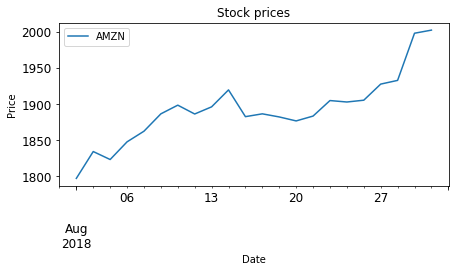

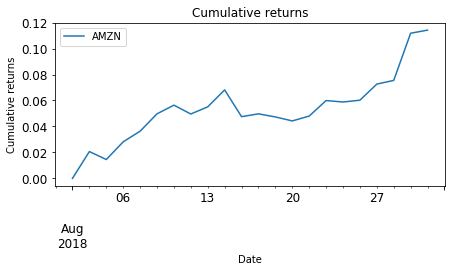

In [7]:
"""Compute cumulative returns."""

import os
import pandas as pd
import matplotlib.pyplot as plt

def symbol_to_path(symbol, base_dir="data/SP500/symbols"):
    """Return CSV file path given ticker symbol."""
    return os.path.join(base_dir, "{}.csv".format(str(symbol)))

def get_data(symbols, dates):
    """Read stock data (adjusted close) for given symbols from CSV files."""
    df = pd.DataFrame(index=dates)
    if 'AMZN' not in symbols:  # add SPY for reference, if absent
        symbols.insert(0, 'AMZN')

    for symbol in symbols:
        df_temp = pd.read_csv(symbol_to_path(symbol), index_col='Date',
                parse_dates=True, usecols=['Date', 'Adj Close'], na_values=['nan'])
        df_temp = df_temp.rename(columns={'Adj Close': symbol})
        df = df.join(df_temp)
        if symbol == 'AMZN':  # drop dates SPY did not trade
            df = df.dropna(subset=["AMZN"])

    return df

def plot_data(df, title="Stock prices", xlabel="Date", ylabel="Price"):
    """Plot stock prices with a custom title and meaningful axis labels."""
    ax = df.plot(title=title, fontsize=12, figsize=(7, 3))
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.show()


def compute_cumulative_returns(df):
    """Compute and return the daily return values."""
    # TODO: Your code here
    # Note: Returned DataFrame must have the same number of rows
    
    cumulative_returns = (df / df.iloc[0]) - 1
        
    return cumulative_returns
    
    #daily_returns = df.copy() # copy gibe DtaFrame to match size and column names
    # compute daily return for row 1 onwards
    #cumula_returns = (df / df.iloc[0]) - 1 # cumulative return is the same as normalitation
    #daily_returns.iloc[0, :] = 0 # set daily returns  for  row 0 to 0
    #return daily_returns

def test_run():
    # Read data
    dates = pd.date_range('2018-08-01', '2018-09-28')  # one month only
    #symbols =  ['AAPL', 'AMZN', 'GOOG', 'HD', 'IBM', 'MCD', 'MMM', 'NFLX', 'NVDA', 'PSX', 'TSLA', 'TXN']
    symbols = ['AMZN']#, 'GOOG', 'HD', 'IBM', 'MCD', 'MMM', 'NFLX', 'NVDA', 'PSX', 'TSLA', 'TXN']
    df = get_data(symbols, dates)
    plot_data(df)

    # Compute daily returns
    cumulative_returns = compute_cumulative_returns(df)
    plot_data(cumulative_returns, title="Cumulative returns", ylabel="Cumulative returns")


if __name__ == "__main__":
    test_run()